## ADS 506 Final

### Project Code

#### John Chen

#### Azucena Faus

----

### Setup

In [716]:
%matplotlib inline
import numpy as np
import pandas as pd
import matplotlib.pylab as plt
import seaborn as sns
import dmba
from pathlib import Path
import datetime
from dateutil.parser import parse
import statsmodels.api as sm
#import statsmodels.formula.api as smf
from sklearn.metrics import accuracy_score
import plotly.express as px
import plotly.io as pio
from pandas import read_csv
import datetime
from numpy import log
from statsmodels.tsa.stattools import adfuller
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.graphics.tsaplots import plot_predict
from statsmodels.tsa.stattools import acf
from statsmodels.tsa.seasonal import seasonal_decompose
from sklearn.metrics import mean_squared_error
from dateutil.parser import parse
from statsmodels.tsa.api import ExponentialSmoothing, SimpleExpSmoothing, Holt
from pandas.plotting import autocorrelation_plot
from pmdarima.arima import auto_arima
from statsmodels.tsa.seasonal import seasonal_decompose
from dateutil.parser import parse
from sklearn.model_selection import ParameterGrid
from sklearn.metrics import r2_score, mean_absolute_error
from prettytable import PrettyTable
import warnings
warnings.filterwarnings('ignore')
warnings.simplefilter(action='ignore', category=FutureWarning)

### Load/Observe Data

In [3]:
Retail_df = pd.read_csv('Online_Retail.csv')
Retail_df.sample(5)

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country
71850,542216,22983,CARD BILLBOARD FONT,12,1/26/2011 12:29,0.42,14911.0,EIRE
187279,552958,21174,POTTERING IN THE SHED METAL SIGN,12,5/12/2011 12:49,2.08,15498.0,United Kingdom
159144,550326,21212,PACK OF 72 RETROSPOT CAKE CASES,1,4/17/2011 13:05,0.55,14532.0,United Kingdom
249707,558906,82483,WOOD 2 DRAWER CABINET WHITE FINISH,2,7/4/2011 16:35,6.95,15555.0,United Kingdom
272433,560772,22720,SET OF 3 CAKE TINS PANTRY DESIGN,1,7/20/2011 16:12,10.79,NaN,United Kingdom


In [39]:
Retail_df.shape

(541909, 8)

In [4]:
Retail_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 541909 entries, 0 to 541908
Data columns (total 8 columns):
 #   Column       Non-Null Count   Dtype  
---  ------       --------------   -----  
 0   InvoiceNo    541909 non-null  object 
 1   StockCode    541909 non-null  object 
 2   Description  540455 non-null  object 
 3   Quantity     541909 non-null  int64  
 4   InvoiceDate  541909 non-null  object 
 5   UnitPrice    541909 non-null  float64
 6   CustomerID   406829 non-null  float64
 7   Country      541909 non-null  object 
dtypes: float64(2), int64(1), object(5)
memory usage: 33.1+ MB


In [6]:
Retail_df.describe()

,Quantity,UnitPrice,CustomerID
count,541909.000000,541909.000000,406829.000000
mean,9.552250,4.611114,15287.690570
std,218.081158,96.759853,1713.600303
min,-80995.000000,-11062.060000,12346.000000
25%,1.000000,1.250000,13953.000000
50%,3.000000,2.080000,15152.000000
75%,10.000000,4.130000,16791.000000
max,80995.000000,38970.000000,18287.000000


----

### Data Cleaning

#### Check for nulls

In [103]:
Retail_noNA = Retail_df.dropna()

In [1451]:

pio.renderers.default='notebook'

dfg = Retail_noNA.groupby(['Description']).size().to_frame().sort_values([0], 
                                                                         ascending = False).head(10).reset_index()
dfg.columns = ['Description', 'count']
fig = px.histogram(dfg, x='Description', y = 'count',
                  title='Top Ten Item Descriptions Purchased on the Site')
fig.layout.yaxis.title.text = 'count'
fig.show()

missing values are not related to the forecast problem variables being used:

In [101]:
Retail_df.isnull().values.any()

True

In [102]:
Retail_df.isnull().sum()

InvoiceNo           0
StockCode           0
Description      1454
Quantity            0
InvoiceDate         0
UnitPrice           0
CustomerID     135080
Country             0
dtype: int64

#### Remove transactions that have to do with returns:

In [719]:


# Remove transactions that were later returned with a negative
# quantity, so find the negative quantities, then
# the matching purchase for that return and remove both records 
# from the data

# But first, make a copy of the dataframe to be modified:

Retail_df_NR = Retail_df.copy()

outlier_rows = Retail_df_NR['Quantity']< 0
outlier=Retail_df_NR[outlier_rows]
outlier

outlierI=outlier.copy()
# find records with negative of the negative quantity (positive)
outlierI['Quantity'] = -outlier['Quantity']

# Combine the data for invoice numbers for purchases that match
# Return invoices with negative quantity values:
commondf=pd.merge(Retail_df_NR,outlierI, on=['StockCode','CustomerID',
                                             'Quantity'])
commondf = commondf.rename(columns={'InvoiceNo_x': 'InvoiceNo'})

vector_invoices=commondf['InvoiceNo']
b=commondf.iloc[:,0].values
c=commondf.iloc[:,1].values

for i in range(0,len(b)):
    invoice_I = (Retail_df_NR['InvoiceNo'] == b[i]) & 
                        (Retail_df_NR['StockCode'] == c[i])
    if Retail_df_NR[invoice_I].empty:
        print('')
    else:

        invoice_I2=Retail_df_NR[invoice_I].index   
        Retail_df_NR=Retail_df_NR.drop(invoice_I2, axis=0)


#Retail_df_NR.shape    
    

Matrix Generated that combines the original transaction with it's Return counterpart:

In [201]:
# This was used to remove all the transactions 
# that were actually refunded so as to not include false
# sales in our forecast.

# The matching item returns are found by matching CustomerID,
# Item StockCode, and Quantity inverted. 

commondf.head()

,InvoiceNo,StockCode,Description_x,Quantity,InvoiceDate_x,UnitPrice_x,CustomerID,Country_x,InvoiceNo_y,Description_y,InvoiceDate_y,UnitPrice_y,Country_y
0,536366,22632,HAND WARMER RED POLKA DOT,6,12/1/2010 8:28,1.85,17850.0,United Kingdom,C543611,HAND WARMER RED RETROSPOT,2/10/2011 14:38,1.85,United Kingdom
1,536372,22632,HAND WARMER RED POLKA DOT,6,12/1/2010 9:01,1.85,17850.0,United Kingdom,C543611,HAND WARMER RED RETROSPOT,2/10/2011 14:38,1.85,United Kingdom
2,536377,22632,HAND WARMER RED POLKA DOT,6,12/1/2010 9:34,1.85,17850.0,United Kingdom,C543611,HAND WARMER RED RETROSPOT,2/10/2011 14:38,1.85,United Kingdom
3,536399,22632,HAND WARMER RED POLKA DOT,6,12/1/2010 10:52,1.85,17850.0,United Kingdom,C543611,HAND WARMER RED RETROSPOT,2/10/2011 14:38,1.85,United Kingdom
4,536407,22632,HAND WARMER RED POLKA DOT,6,12/1/2010 11:34,1.85,17850.0,United Kingdom,C543611,HAND WARMER RED RETROSPOT,2/10/2011 14:38,1.85,United Kingdom


In [199]:
# new size of the retail data:
Retail_df_NR.shape

(532960, 8)

In [200]:
# Since the for loop to get rid of
# returns lasted too long, saved the data
# for future reference on modeling etc:

Retail_df_NR.to_csv('Retail_NoReturn_Transactions.csv')

In [ ]:
p=sns.jointplot(x='vote_average',y='vote_count', data=Retail_df)
p.fig.suptitle("Relationship between Vote_Average and Vote_Count in Movie MetaData")

#### Remove Irrelevant and Unrealistic Records:

These have to do with fees, postage, and adjusted debt/credit transactions, not retail orders

In [202]:

# Remove rows with negative quantities - these were used during adjustments
unreal_rows1 = Retail_df_NR[Retail_df_NR['Quantity'] <= 0].index


Retail_df_pre3 = Retail_df_pre2.drop(index=unreal_rows3)
unreal_rows4 = Retail_df_pre3[(Retail_df_pre3['StockCode'] == 'AMAZONFEE') |
                             (Retail_df_pre3['StockCode'] == 'DOT') |
                             (Retail_df_pre3['StockCode'] == 'M') |
                             (Retail_df_pre3['StockCode'] == 'B') |
                             (Retail_df_pre3['StockCode'] == 'POST')].index

Retail_df_pre4 = Retail_df_pre3.drop(index=unreal_rows4)



Data after removing both returns and irrelevant transactions that have nothing to do with sales:

In [203]:
Retail_df_pre4.describe()

,Quantity,UnitPrice,CustomerID
count,519966.000000,519966.000000,391016.000000
mean,10.171529,3.235760,15300.029428
std,36.451073,4.165506,1709.264898
min,1.000000,0.001000,12347.000000
25%,1.000000,1.250000,13971.000000
50%,3.000000,2.080000,15159.000000
75%,11.000000,4.130000,16800.000000
max,4800.000000,649.500000,18287.000000


In [204]:
Retail_df_pre4.shape

(519966, 8)

In [1022]:
Retail_TimeSeries_df=Retail_df_pre4.copy()

In [244]:
Retail_TimeSeries_df.isna().sum()

InvoiceNo           0
StockCode           0
Description         0
Quantity            0
InvoiceDate         0
UnitPrice           0
CustomerID     128950
Country             0
dtype: int64

#### Feature engineering SalesTotal:

In [245]:
Retail_TimeSeries_df['Sales'] = (Retail_TimeSeries_df['Quantity'] * 
                                 Retail_TimeSeries_df['UnitPrice'])

---

### Exploratory Data Analysis

#### Observe time series and distributions based on size of orders

In [253]:
rows_small_orders = (Retail_TimeSeries_df['Quantity'] < 100)
Retail_df_small_orders = Retail_TimeSeries_df[rows_small_orders]
Retail_df_small_orders.shape

(513663, 9)

In [221]:
rows_medlarge_orders = (Retail_TimeSeries_df['Quantity'] >= 100) & 
                                    (Retail_TimeSeries_df['Quantity'] < 1000)
Retail_df_medlarge_orders = Retail_TimeSeries_df[rows_medlarge_orders]
Retail_df_medlarge_orders.shape

(6201, 9)

In [222]:
rows_large_orders = Retail_TimeSeries_df['Quantity'] >= 1000
Retail_df_large_orders = Retail_TimeSeries_df[rows_large_orders]

In [223]:
Retail_df_large_orders.shape

(102, 9)

#### Small order distributions (under 100 units)

In [1449]:
dfg_small_order = Retail_df_small_orders.groupby(['Description']).size().to_frame().sort_values([0], ascending = False).head(10).reset_index()
dfg_small_order.columns = ['Description', 'count']
fig = px.histogram(dfg_small_order, x='Description', y = 'count',
                  title='Top Ten Item Descriptions Purchased on Small Size orders')
fig.layout.yaxis.title.text = 'count'
fig.show()

Text(0.5, 0.98, 'Histograms for orders under 100')

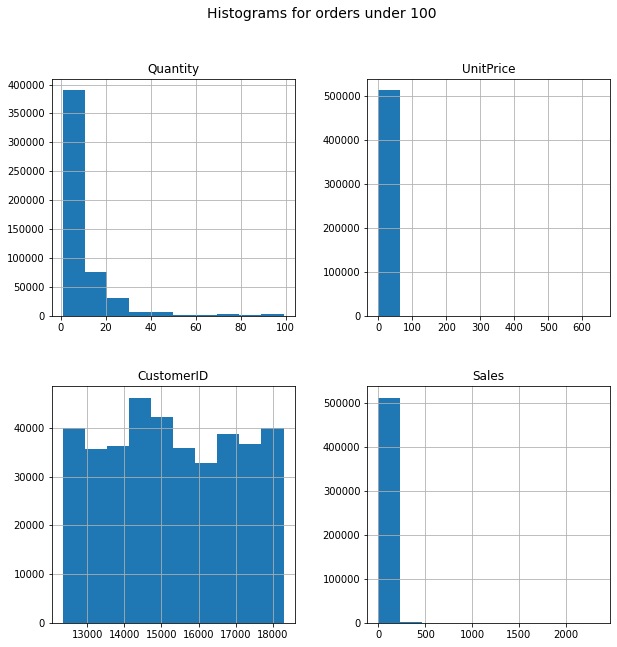

In [256]:
Retail_df_small_orders.hist(figsize=[10,10])
plt.suptitle("Histograms for orders under 100", fontsize=14)

#### Large (>1000) order distributions:

In [407]:
dfg_large_order = Retail_df_large_orders.groupby(['Description']).size().to_frame().
                                                                sort_values([0], 
                                                                ascending = False).head(10).
                                                                reset_index()
dfg_large_order.columns = ['Description', 'count']
fig = px.histogram(dfg_large_order, x='Description', y = 'count',
                  title='Top Ten Item Descriptions Purchased on Large Size orders')
fig.layout.yaxis.title.text = 'count'
fig.show()

Text(0.5, 0.98, 'Histograms for orders over 1000')

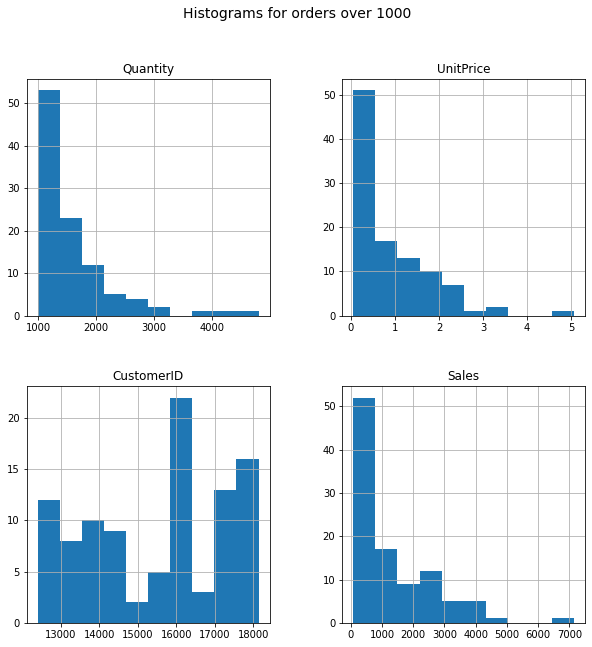

In [224]:
Retail_df_large_orders.hist(figsize=[10,10])
plt.suptitle("Histograms for orders over 1000", fontsize=14)


In [225]:
Retail_df_large_orders.to_csv('Retail_df_large_orders.csv')

#### Medium (100-1000 units) order Distributions:

In [408]:
dfg_medium_order = Retail_df_medlarge_orders.groupby(['Description']).size().to_frame().
                                                sort_values([0], 
                                                            ascending = False).head(10).
                                                            reset_index()
dfg_medium_order.columns = ['Description', 'count']
fig = px.histogram(dfg_medium_order, x='Description', y = 'count',
                  title='Top Ten Item Descriptions Purchased on Medium Size orders')
fig.layout.yaxis.title.text = 'count'
fig.show()

Text(0.5, 0.98, 'Histograms for orders over 100 but less than 1000')

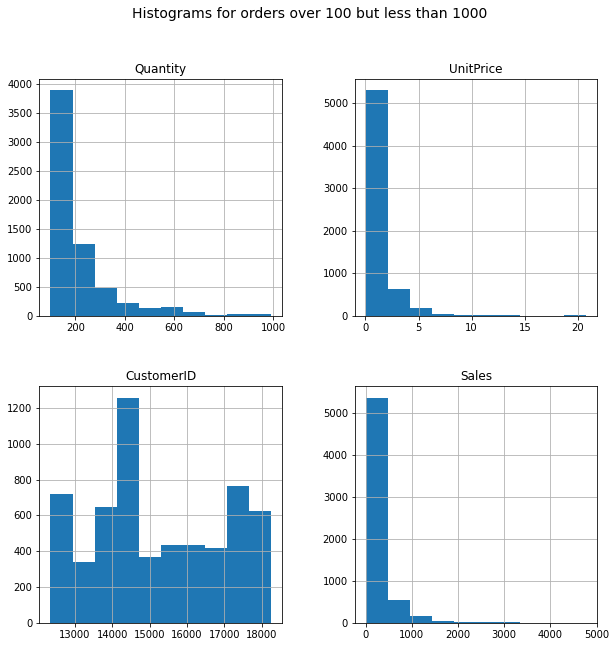

In [226]:
Retail_df_medlarge_orders.hist(figsize=[10,10])
plt.suptitle("Histograms for orders over 100 but less than 1000", fontsize=14)

#### Most popular items purchased:

In [409]:

pio.renderers.default='notebook'

dfg = Retail_TimeSeries_df.groupby(['Description']).size().
                                            to_frame().sort_values([0], 
                                            ascending = False).head(10).reset_index()
dfg.columns = ['Description', 'count']
fig = px.histogram(dfg, x='Description', y = 'count',
                  title='Top Ten Item Descriptions Purchased on the Site')
fig.layout.yaxis.title.text = 'count'
fig.show()

In [233]:
MostCommonItem = Retail_TimeSeries_df[Retail_TimeSeries_df['Description'].
                                      str.contains('WHITE HANGING HEART T-LIGHT HOLDER', 
                                                   na=False)]

In [234]:
MostCommonItem.shape

(2293, 9)

In [236]:
MostCommonItem.describe()

,Quantity,UnitPrice,CustomerID,Sales
count,2293.000000,2293.000000,1998.000000,2293.000000
mean,14.501526,3.221029,15558.954454,41.273973
std,43.009513,0.995402,1618.141817,129.383443
min,1.000000,2.550000,12370.000000,2.950000
25%,3.000000,2.950000,14221.000000,8.850000
50%,6.000000,2.950000,15584.000000,17.700000
75%,12.000000,2.950000,16931.000000,35.400000
max,1010.000000,6.770000,18283.000000,3272.400000


In [238]:
MostCommonItem.Sales.sum()

94641.22

#### Particular item order Distributions: Clocks

In [227]:
clock = Retail_TimeSeries_df[Retail_TimeSeries_df['Description'].
                             str.contains('CLOCK', 
                                          na=False)]

In [441]:
clock.shape

(7025, 9)

In [259]:
clock_test = Retail_df_small_orders[Retail_df_small_orders['Description'].
                                    str.contains('CLOCK', 
                                                 na=False)]
clock_test.shape

(6990, 9)

**Most clock sales come from small orders with some coming from medium sized orders**

In [219]:
clock.shape

(7025, 8)

In [237]:
clock.describe()

,Quantity,UnitPrice,CustomerID,Sales
count,7025.000000,7025.000000,5726.000000,7025.000000
mean,5.303203,6.096231,15250.322040,23.958272
std,18.973171,3.737963,1739.507654,76.379316
min,1.000000,0.190000,12347.000000,0.190000
25%,1.000000,3.750000,13767.000000,8.290000
50%,2.000000,3.750000,15178.000000,15.000000
75%,4.000000,8.500000,16729.000000,19.900000
max,620.000000,49.960000,18280.000000,2662.200000


In [239]:
clock.Sales.sum()

168306.86000000002

#### Sales from clocks alone amount to a total of 168,306 as opposed to the most popular item that amounts to 94,641 and with projected interest in clocks going up, must look at initial forecasts for this item.

Text(0.5, 0.98, 'Histograms for orders of Clocks')

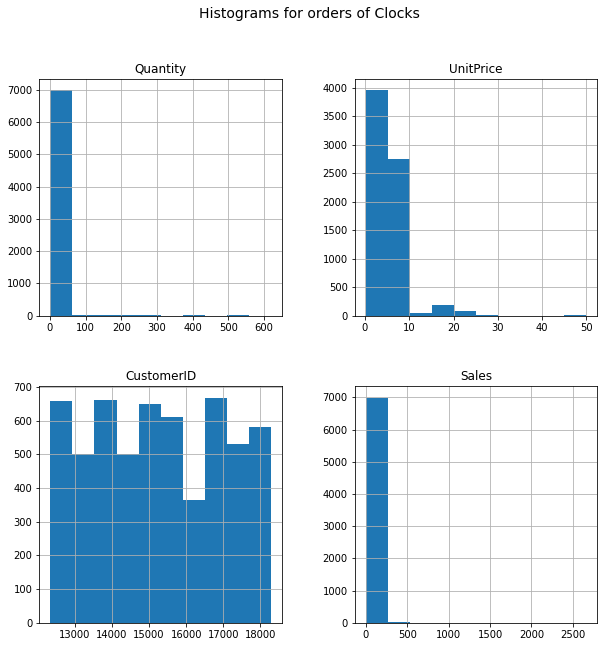

In [228]:
clock.hist(figsize=[10,10])
plt.suptitle("Histograms for orders of Clocks", fontsize=14)

In [ ]:
clock['Clock_Purchase'] = 1

#### Relationship between Sales and other variables

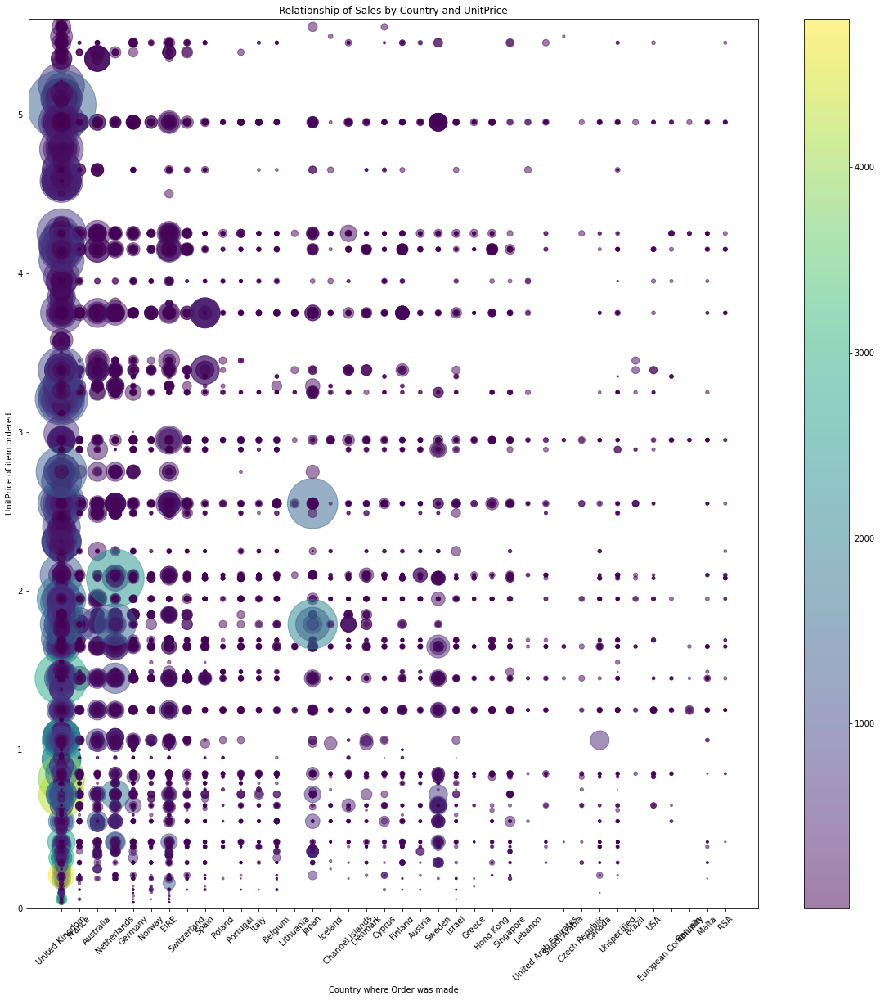

In [264]:
plt.figure(figsize=(20,20))
plt.scatter(Retail_TimeSeries_df['Country'], Retail_TimeSeries_df['UnitPrice'], 
            s=Retail_TimeSeries_df['Sales'], c=Retail_TimeSeries_df['Quantity'], 
            alpha=0.5
           )
plt.gca().update(dict(title='Relationship of Sales by Country and UnitPrice', 
                      xlabel='Country where Order was made', ylabel='UnitPrice of item ordered', 
                      ylim=(0,5.6)))
plt.xticks(rotation=45)
plt.colorbar()
plt.show()

**Most orders are from the UK and most are small size orders (darker purple). Large Sale values span the unit price range.**

### Time Series Plots

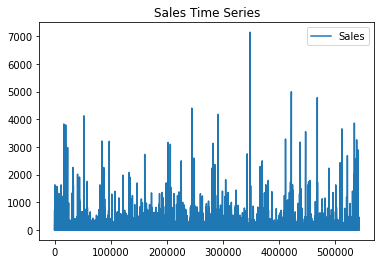

In [247]:
Retail_SalesOnly = Retail_TimeSeries_df.copy()
Retail_SalesOnly.drop(columns=['InvoiceNo', 'CustomerID','UnitPrice','Quantity'],
                      inplace=True)

Retail_Sales.plot()
plt.title('Sales Time Series')
plt.show()

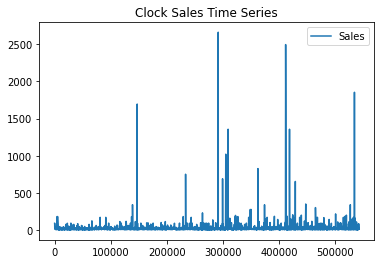

In [248]:
Clock_SalesOnly = clock.copy()
Clock_SalesOnly.drop(columns=['InvoiceNo', 'CustomerID','UnitPrice','Quantity'],
                     inplace=True)

Clock_SalesOnly.plot()
plt.title('Clock Sales Time Series')
plt.show()

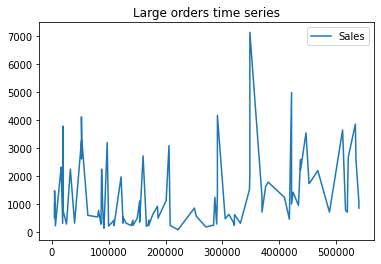

In [249]:

series_time_retail = read_csv('Retail_df_large_orders.csv', header=0, index_col=0, 
                              parse_dates=True, 
                              squeeze=True)
series_time_retail.drop(columns=['InvoiceNo', 'CustomerID','UnitPrice','Quantity'],
                        inplace=True)

series_time_retail.plot()
plt.title('Large orders time series')
plt.show()

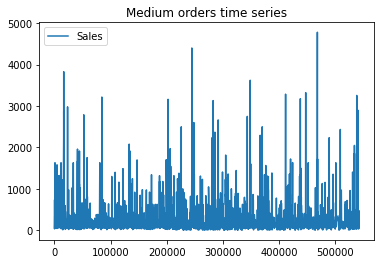

In [250]:
series_time_retail2 = Retail_df_medlarge_orders.copy()
series_time_retail2.drop(columns=['InvoiceNo', 'CustomerID','UnitPrice','Quantity'],
                         inplace=True)

series_time_retail2.plot()
plt.title('Medium orders time series')
plt.show()

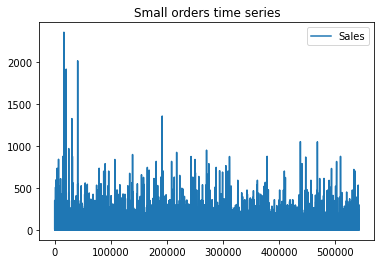

In [260]:
series_time_retail3 = Retail_df_small_orders.copy()
series_time_retail3.drop(columns=['InvoiceNo', 'CustomerID','UnitPrice','Quantity'],
                         inplace=True)

series_time_retail3.plot()
plt.title('Small orders time series')
plt.show()

* Most orders originate from the UK, which is where the company is based
* Most sales are small quantities (purple color)

----

### Clock Modeling Pre-Processing Sales Data Set:

Time series by Date:

In [410]:
clock.to_csv('Clock_Retail_UKdata.csv')

In [1023]:
Clock_TimeSeries_date_df = read_csv('Clock_Retail_UKdata.csv', header=0, index_col=0, 
                                    parse_dates=True, squeeze=True)
Clock_TimeSeries_date_df['InvoiceDate'] = pd.to_datetime(Clock_TimeSeries_date_df['InvoiceDate'])   

Clock_TimeSeries_date_df=Clock_TimeSeries_date_df.set_index('InvoiceDate')

In [1024]:
Clock_TimeSeries_date_df.head()

,InvoiceNo,StockCode,Description,Quantity,UnitPrice,CustomerID,Country,Sales
InvoiceDate,,,,,,,,
2010-12-01 08:45:00,536370,22728,ALARM CLOCK BAKELIKE PINK,24,3.75,12583.0,France,90.0
2010-12-01 08:45:00,536370,22727,ALARM CLOCK BAKELIKE RED,24,3.75,12583.0,France,90.0
2010-12-01 08:45:00,536370,22726,ALARM CLOCK BAKELIKE GREEN,12,3.75,12583.0,France,45.0
2010-12-01 09:45:00,536382,22726,ALARM CLOCK BAKELIKE GREEN,4,3.75,16098.0,United Kingdom,15.0
2010-12-01 10:03:00,536389,22193,RED DINER WALL CLOCK,2,8.50,12431.0,Australia,17.0


Focus only on UK sales:

In [1025]:
Clock_TimeSeries_date_df = 
            Clock_TimeSeries_date_df[Clock_TimeSeries_date_df['Country'].
                                        str.contains('United Kingdom', 
                                                    na=False)]

In [1026]:
Clock_TimeSeries_date_df.head()

,InvoiceNo,StockCode,Description,Quantity,UnitPrice,CustomerID,Country,Sales
InvoiceDate,,,,,,,,
2010-12-01 09:45:00,536382,22726,ALARM CLOCK BAKELIKE GREEN,4,3.75,16098.0,United Kingdom,15.0
2010-12-01 10:47:00,536395,22730,ALARM CLOCK BAKELIKE IVORY,4,3.75,13767.0,United Kingdom,15.0
2010-12-01 10:47:00,536395,22727,ALARM CLOCK BAKELIKE RED,8,3.75,13767.0,United Kingdom,30.0
2010-12-01 10:47:00,536395,22729,ALARM CLOCK BAKELIKE ORANGE,8,3.75,13767.0,United Kingdom,30.0
2010-12-01 10:47:00,536395,22726,ALARM CLOCK BAKELIKE GREEN,8,3.75,13767.0,United Kingdom,30.0


In [1027]:
Clock_TimeSeries_date_df.shape

(6281, 8)

<Figure size 600x360 with 0 Axes>

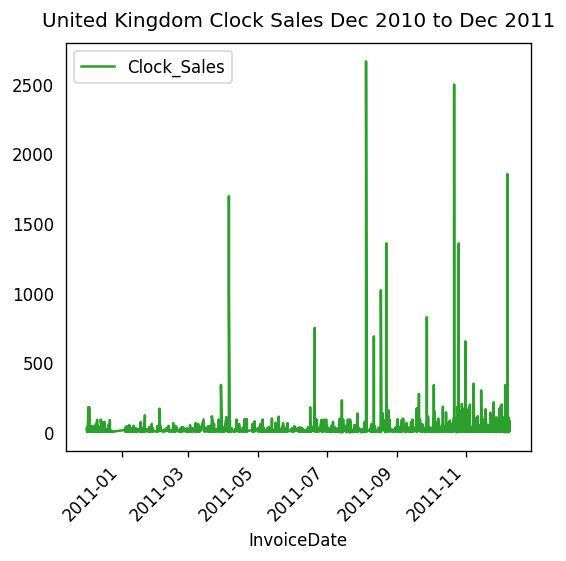

In [1276]:
UK_clock_ts = Clock_TimeSeries_date_df.copy()
UK_clock_ts.drop(columns=['InvoiceNo', 'CustomerID','UnitPrice','Quantity',
                         'StockCode','Description','Country'],inplace=True)
plt.figure(figsize=(5,3))
UK_clock_ts.plot(color='tab:green')
plt.title('United Kingdom Clock Sales Dec 2010 to Dec 2011')
plt.xticks(rotation=45)
plt.legend(['Clock_Sales'])
plt.show()


**Sales per Day:**

In [992]:
UK_clock_ts.head()

,Sales
InvoiceDate,
2010-12-01 09:45:00,15.0
2010-12-01 10:47:00,15.0
2010-12-01 10:47:00,30.0
2010-12-01 10:47:00,30.0
2010-12-01 10:47:00,30.0


In [993]:
UK_clock_ts.shape

(6269, 1)

**Clock Dataset with only Daily Sales and Date Index:**

In [1029]:
UK_DailyClock_ts = UK_clock_ts.iloc[:,0].resample('d').sum()

In [1030]:
UK_DailyClock_df=pd.DataFrame(UK_DailyClock_ts)

In [1032]:
UK_DailyClock_df.head()

,Sales
InvoiceDate,
2010-12-01,568.40
2010-12-02,747.25
2010-12-03,587.62
2010-12-04,0.00
2010-12-05,547.25


In [1033]:
UK_DailyClock_df = UK_DailyClock_df[UK_DailyClock_df['Sales'] > 1]

In [1447]:
UK_DailyClock_df.describe()

,Sales
count,303.000000
mean,474.837789
std,602.157229
min,3.750000
25%,187.500000
50%,328.450000
75%,541.750000
max,5527.710000


-----

<Figure size 720x480 with 0 Axes>

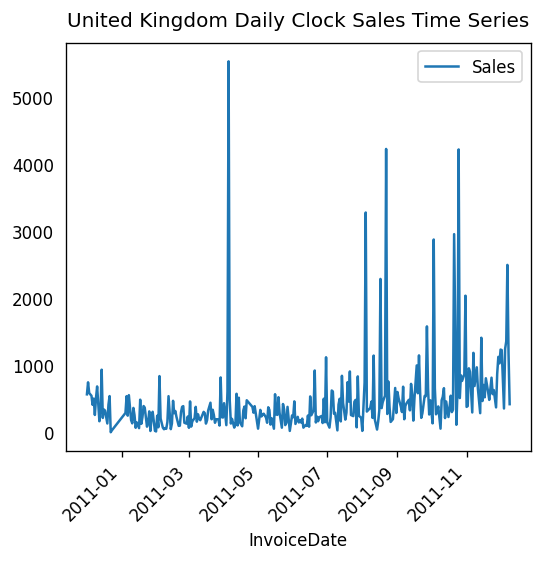

In [1036]:
plt.figure(figsize=(6,4))
UK_DailyClock_df.plot()

plt.title('United Kingdom Daily Clock Sales Time Series')
plt.xticks(rotation=45)
plt.show()

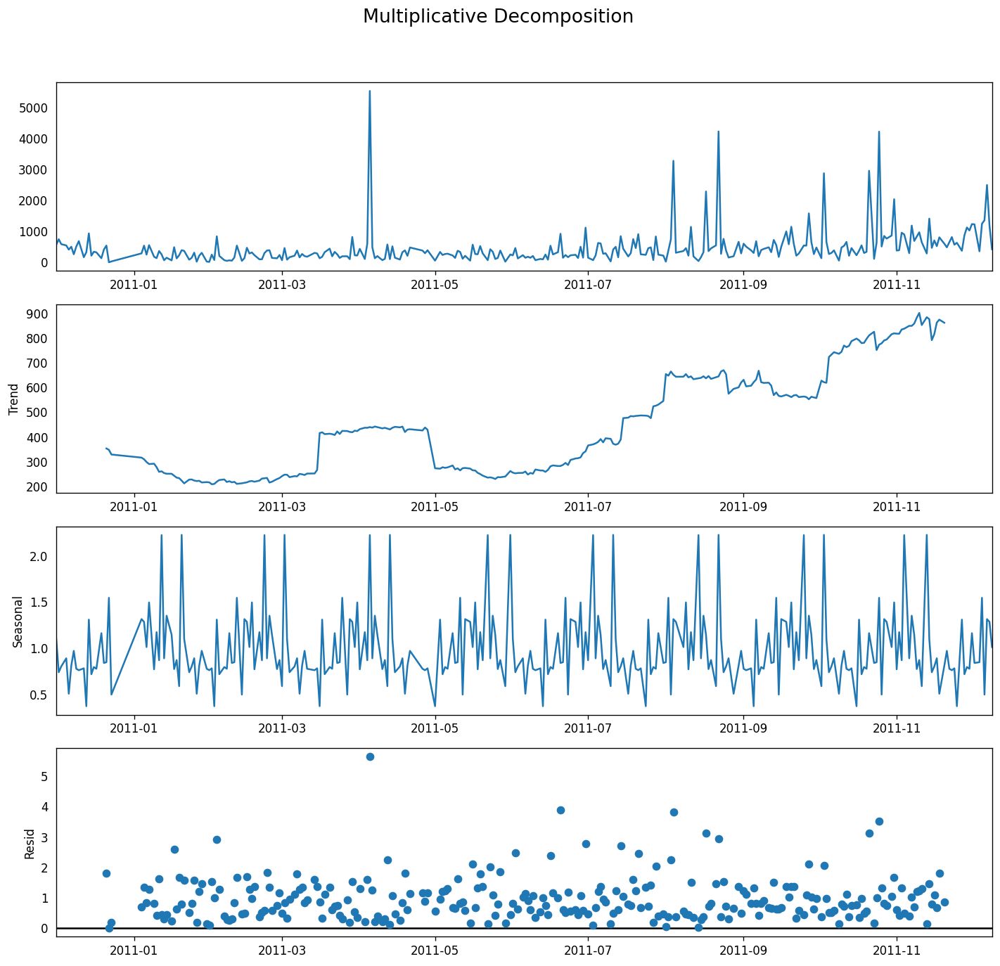

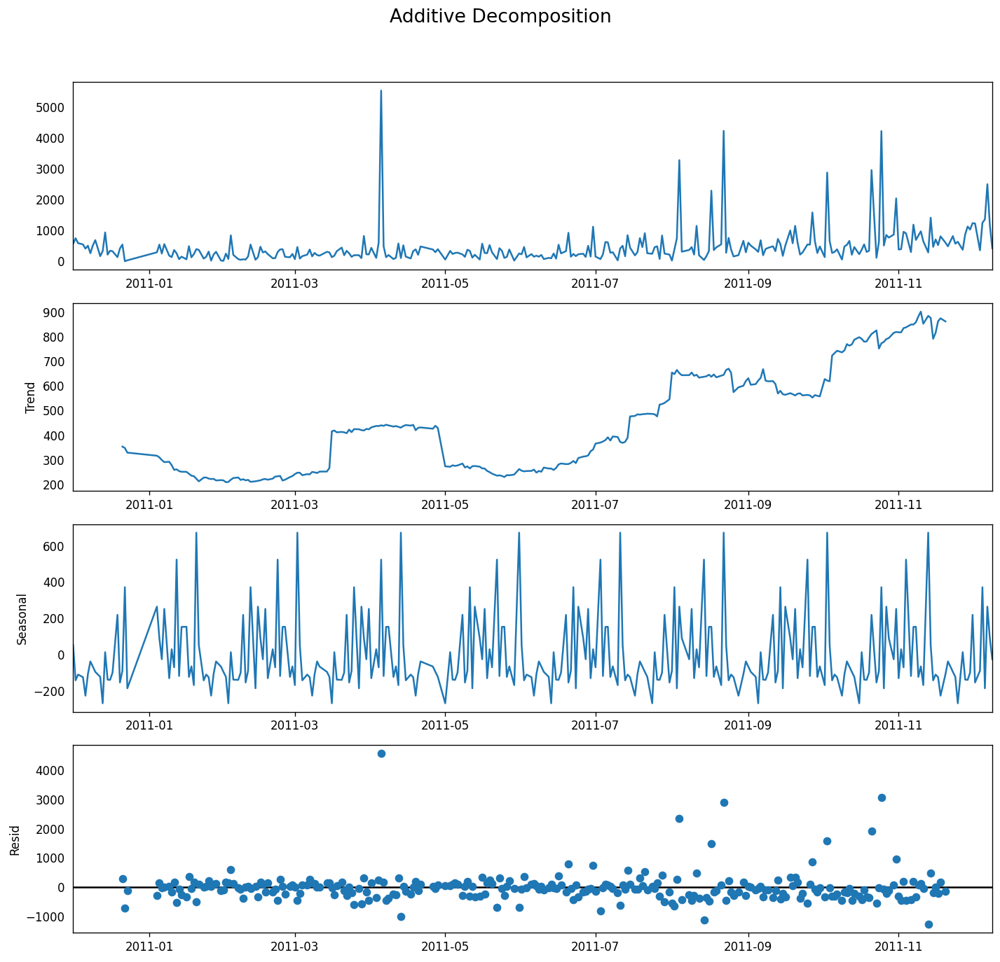

In [1037]:
# Decomposition
# Decomposition of a time series can be performed by considering 
# the series as an additive or multiplicative combination of the 
# base level, trend, seasonal index and the residual term.

# Multiplicative Decomposition 
multiplicative_decomposition = seasonal_decompose(UK_DailyClock_df, 
                                                  model='multiplicative', 
                                                  period=35)

# Additive Decomposition
additive_decomposition = seasonal_decompose(UK_DailyClock_df, 
                                            model='additive', 
                                            period=35)

# Plot
plt.rcParams.update({'figure.figsize': (12,12)})
multiplicative_decomposition.plot().suptitle('Multiplicative Decomposition', 
                                             fontsize=16)
plt.tight_layout(rect=[0, 0.03, 1, 0.95])

additive_decomposition.plot().suptitle('Additive Decomposition', 
                                       fontsize=16)
plt.tight_layout(rect=[0, 0.03, 1, 0.95])

plt.show()

#### If we look at the residuals of the additive decomposition closely, it has some pattern left over.

#### The multiplicative decomposition, looks quite random which is good. So ideally, multiplicative decomposition should be preferred for this particular series.

----

### Stationarity and Correlation Tests on Time Series:

In [1038]:
# Check for stationarity and if the signal is a random walk:

result = adfuller(UK_DailyClock_df.dropna())
print('ADF Statistic: %f' % result[0])
print('p-value: %f' % result[1])

ADF Statistic: -4.112281
p-value: 0.000924


* Null Hypothesis: series is non-stationary

* Alternate Hypothesis: series is stationary

    * p-value is < 0.05 so we can reject the null hypothesis.

    * Therefore, the series is stationary

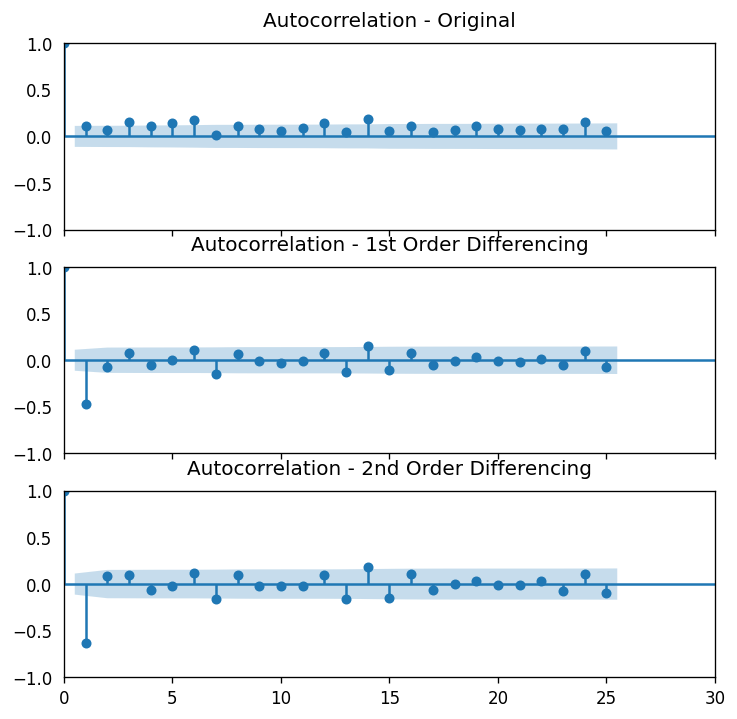

In [1039]:
plt.rcParams.update({'figure.figsize':(7,7), 'figure.dpi':120})
# Import data

# Original Series
fig, axes = plt.subplots(3, sharex=True)

plot_acf(UK_DailyClock_df, ax=axes[0])
axes[0].set_title('Autocorrelation - Original')

plot_acf(UK_DailyClock_df.diff().dropna(), ax=axes[1])
axes[1].set_title('Autocorrelation - 1st Order Differencing')

plot_acf(UK_DailyClock_df.diff().diff().dropna(), ax=axes[2])
axes[2].set_title('Autocorrelation - 2nd Order Differencing')

plt.xlim([0, 30])
plt.show()


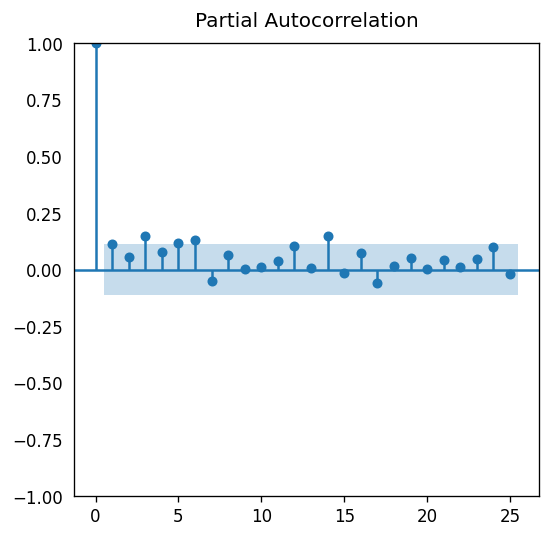

In [1040]:
# PACF plot 
plt.rcParams.update({'figure.figsize':(5,5), 'figure.dpi':120})

pacf = plot_pacf(UK_DailyClock_df['Sales'], lags=25)
plt.title('Partial Autocorrelation')
plt.show()


#### The above plot can be used to determine the order of AR model. You may note that a correlation value up to order 3 is high enough. Thus, we will train the AR model of order 3.

#### If partial autocorrelation values are close to 0, then values between observations and lagged observations are not correlated with one another. Inversely, partial autocorrelations with values close to 1 or -1 indicate that there exists strong positive or negative correlations between the lagged observations of the time series.

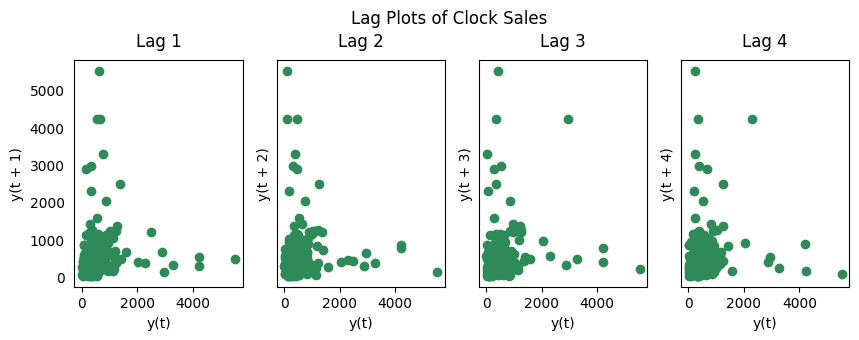

In [1041]:
# Lag Plots

from pandas.plotting import lag_plot
plt.rcParams.update({'ytick.left' : False, 'axes.titlepad':10})

# Plot
fig, axes = plt.subplots(1, 4, figsize=(10,3), sharex=True, 
                         sharey=True, dpi=100)
for i, ax in enumerate(axes.flatten()[:4]):
    lag_plot(UK_DailyClock_df['Sales'], lag=i+1, ax=ax, c='seagreen')
    ax.set_title('Lag ' + str(i+1))

fig.suptitle('Lag Plots of Clock Sales', y=1.05)    
plt.show()

#### A Lag plot is a scatter plot of a time series against a lag of itself. It is normally used to check for autocorrelation. If there is any pattern existing in the series, the series is autocorrelated. If there is no such pattern, the series is likely to be random white noise.

### Naive Forecast Method

*30 day prediction*

In [1162]:
# Split Train / Test

train_length = 273
train = UK_DailyClock_df[0:train_length]
test = UK_DailyClock_df[train_length:]
print(len(train))
print('')
print(len(test))

273

30


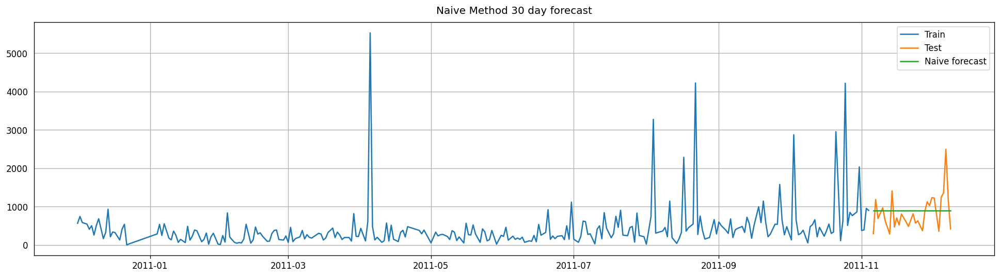

In [1184]:
# Naive Forecast

naive = test.copy()
naive['naive_forecast'] = train['Sales'][len(train)-1]

plt.figure(figsize=(20,5))
plt.grid()
plt.plot(train['Sales'], label='Train')
plt.plot(test['Sales'], label='Test')
plt.plot(naive['naive_forecast'], label='Naive forecast')
plt.legend(loc='best')
plt.title('Naive Method 30 day forecast')
plt.show()

In [1044]:
n_rmse = np.sqrt(mean_squared_error(test['Sales'], 
                                    naive['naive_forecast'])).round(2)
n_mape = np.round(np.mean(np.abs(test['Sales']-
                                 naive['naive_forecast'])/
                          test['Sales'])*100,2)

results = pd.DataFrame({'Method':['Naive method 30 day'], 
                        'MAPE': [n_mape], 'RMSE': [n_rmse]})
results = results[['Method', 'RMSE', 'MAPE']]
results

,Method,RMSE,MAPE
0,Naive method,452.17,56.61


####  Per the graph naive method is not suitable for data with high variability 

### Simple Average

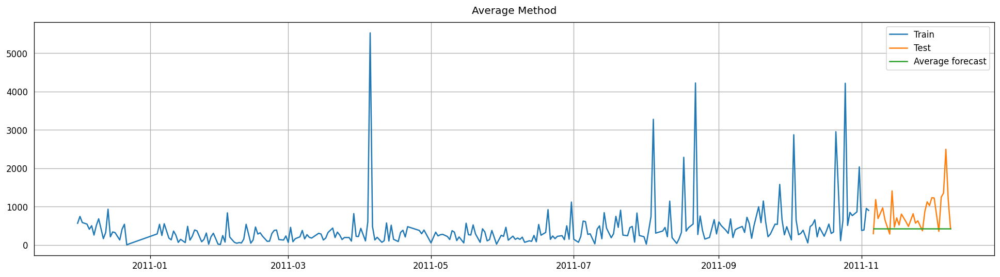

In [1045]:
simple_average = test.copy()
simple_average['avg_forecast'] = train['Sales'].mean()

plt.figure(figsize=(20,5))
plt.grid()
plt.plot(train['Sales'], label='Train')
plt.plot(test['Sales'], label='Test')
plt.plot(simple_average['avg_forecast'], 
         label='Average forecast')
plt.legend(loc='best')
plt.title('Average Method')
plt.show()

In [1046]:
sa_rmse = np.sqrt(mean_squared_error(test['Sales'], simple_average['avg_forecast'])).round(2)
sa_mape = np.round(np.mean(np.abs(test['Sales']-
                                  simple_average['avg_forecast'])/
                           test['Sales'])*100,2)

results = pd.DataFrame({'Method':['Average method'], 
                        'MAPE': [sa_mape], 'RMSE': [sa_rmse]})
results = results[['Method', 'RMSE', 'MAPE']]
results

,Method,RMSE,MAPE
0,Average method,613.02,43.52


#### This model did improve our score, it seems the average of our data is pretty consistent.

### Moving Average

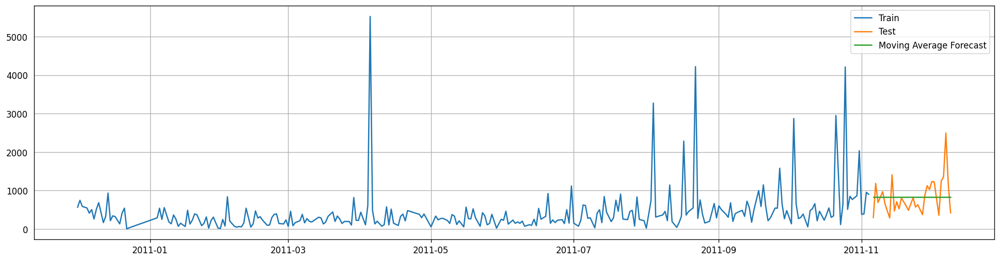

In [1047]:
moving_avg = test.copy()
moving_avg['moving_avg_forecast'] = 
                        train['Sales'].rolling(29).mean().iloc[-1]

plt.figure(figsize=(20,5))
plt.grid()
plt.plot(train['Sales'], label='Train')
plt.plot(test['Sales'], label='Test')
plt.plot(moving_avg['moving_avg_forecast'], 
         label='Moving Average Forecast')
plt.legend(loc='best')
plt.show()

In [1048]:
ma_rmse = np.sqrt(mean_squared_error(test['Sales'], moving_avg['moving_avg_forecast'])).round(2)
ma_mape = np.round(np.mean(np.abs(test['Sales']-
                                  moving_avg['moving_avg_forecast'])/
                           test['Sales'])*100,2)

results = pd.DataFrame({'Method':['Moving Average method'], 
                        'MAPE': [ma_mape], 'RMSE': [ma_rmse]})
results = results[['Method', 'RMSE', 'MAPE']]
results

,Method,RMSE,MAPE
0,Moving Average method,449.3,50.82


#### Interestingly enough this model did not improve our results after choosing the last 60 days. We could adjust the window and see if that improves our results. 

### Simple Exponential Smoothing

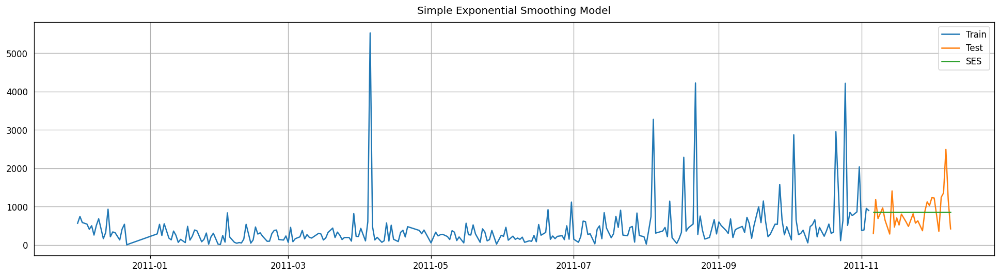

In [1291]:
ses = test.copy()
ses_fit = SimpleExpSmoothing(np.asarray(train['Sales'])).fit(smoothing_level=0.6,
                                                             optimized=False)
ses['SES'] = ses_fit.forecast(len(test))

plt.figure(figsize=(20,5))
plt.grid()
plt.plot(train['Sales'], label='Train')
plt.plot(test['Sales'], label='Test')
plt.plot(ses['SES'], label='SES')
plt.title('Simple Exponential Smoothing Model')
plt.legend(loc='best')
plt.show()

In [1058]:
se_rmse = np.sqrt(mean_squared_error(test['Sales'], ses['SES'])).round(2)
se_mape = np.round(np.mean(np.abs(test['Sales']-
                                  ses['SES'])/
                           test['Sales'])*100,2)

results = pd.DataFrame({'Method':['Simple Exponential Smoothing method'], 
                        'MAPE': [se_mape], 
                        'RMSE': [se_rmse]})
results = results[['Method', 'RMSE', 'MAPE']]
results

,Method,RMSE,MAPE
0,Simple Exponential Smoothing method,449.3,53.06


#### So far the second best model after simple average. We can tune to alpha from 0.6 to another number to see if it helps improve the model. 

### Holt Linear Method (double exponential smoothing)

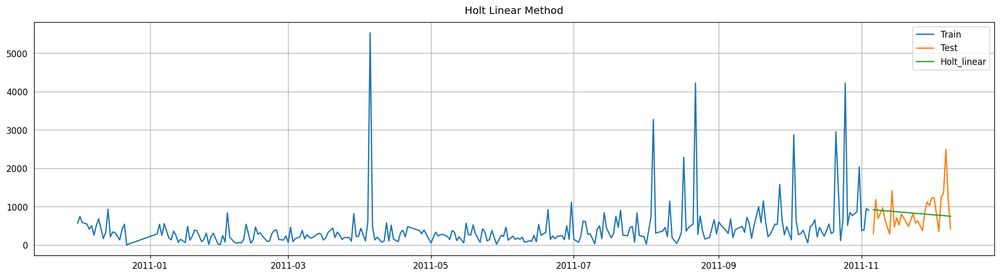

In [1292]:
holt = test.copy()
holt_fit = Holt(np.asarray(train['Sales'])).fit(smoothing_level = 0.3, 
                                                smoothing_slope = 0.1)
holt['Holt_linear'] = holt_fit.forecast(len(test))

plt.figure(figsize=(20,5))
plt.grid()
plt.plot(train['Sales'], label='Train')
plt.plot(test['Sales'], label='Test')
plt.plot(holt['Holt_linear'], label='Holt_linear')
plt.legend(loc='best')
plt.title('Holt Linear Method')
plt.show()

In [1060]:
hl_rmse = np.sqrt(mean_squared_error(test['Sales'], holt['Holt_linear'])).round(2)
hl_mape = np.round(np.mean(np.abs(test['Sales']-
                                  holt['Holt_linear'])/
                           test['Sales'])*100,2)

results = pd.DataFrame({'Method':['Holt Linear method'], 
                        'MAPE': [hl_mape], 'RMSE': [hl_rmse]})
results = results[['Method', 'RMSE', 'MAPE']]
results

,Method,RMSE,MAPE
0,Holt Linear method,470.65,53.09


#### Results were not very good on the first run, model can be tuned to see if there's improvement

### Holt Winters Method

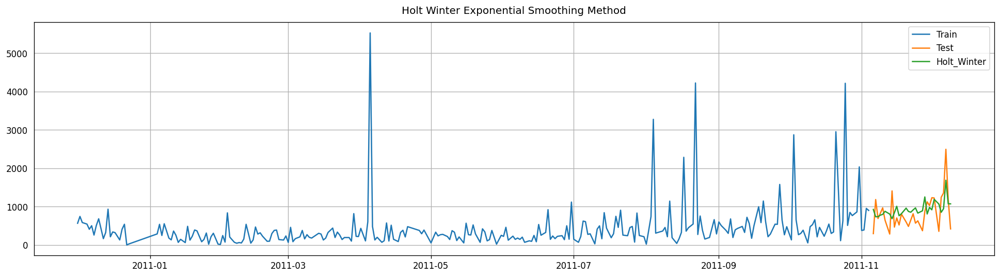

In [1293]:
hw = test.copy()
hw_fit = ExponentialSmoothing(np.asarray(train['Sales']) ,seasonal_periods=29 ,
                              trend='add',seasonal='add').fit()
hw['Holt_Winter'] = hw_fit.forecast(len(test))

plt.figure(figsize=(20,5))
plt.grid()
plt.plot( train['Sales'], label='Train')
plt.plot(test['Sales'], label='Test')
plt.plot(hw['Holt_Winter'], label='Holt_Winter')
plt.title('Holt Winter Method')
plt.legend(loc='best')
plt.show()

In [1064]:
hw_rmse = np.sqrt(mean_squared_error(test['Sales'], hw['Holt_Winter'])).round(2)
hw_mape = np.round(np.mean(np.abs(test['Sales']-
                                  hw['Holt_Winter'])/
                           test['Sales'])*100,2)

results = pd.DataFrame({'Method':['Holt Winters method'], 
                        'MAPE': [hw_mape], 'RMSE': [hw_rmse]})
results = results[['Method', 'RMSE', 'MAPE']]
results

,Method,RMSE,MAPE
0,Holt Winters method,401.7,56.79


### Iterative Holt Winters

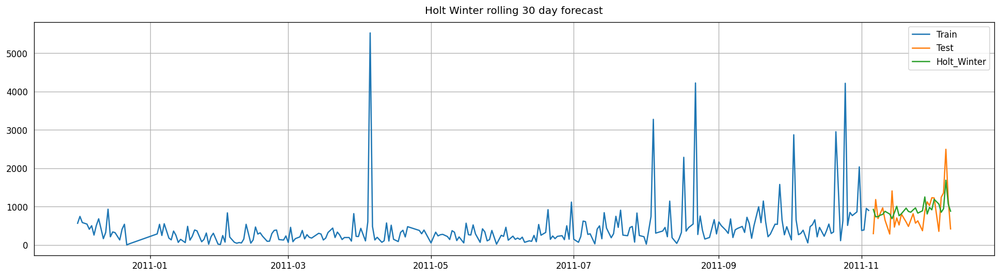

In [1273]:
# One forecast at a time that is then added to the training 
# set and model is recalculated to fit for that new value
# to then repeat a single prediction once again.

hw12 = test.copy()
hw_fit12 = ExponentialSmoothing(np.asarray(train['Sales']) ,seasonal_periods=29 ,
                              trend='add',seasonal='add').fit()
# rolling forecast:
training_set=train.copy()

for ii in range(0,len(test)):
    hw12.loc[hw12.index[ii], 'Holt_Winter'] = hw_fit12.forecast(1)
    training_set.loc[len(training_set.index), 'Sales'] = hw12.loc[hw12.index[ii], 'Holt_Winter']
    #training_set_loc[]
    hw_fit12 = ExponentialSmoothing(np.asarray(training_set['Sales']) ,seasonal_periods=29 ,
                              trend='add',seasonal='add').fit()
    
hw12.loc[hw12.index[ii], 'Holt_Winter'] = hw_fit12.forecast(1)

plt.figure(figsize=(20,5))
plt.grid()
plt.plot( train['Sales'], label='Train')
plt.plot(test['Sales'], label='Test')
plt.plot(hw12['Holt_Winter'], label='Holt_Winter')
plt.legend(loc='best')
plt.title('Holt Winter rolling 30 day forecast')
plt.show()

In [1274]:
hw_rmse12 = np.sqrt(mean_squared_error(test['Sales'], hw12['Holt_Winter'])).round(2)
hw_mape12 = np.round(np.mean(np.abs(test['Sales']-hw12['Holt_Winter'])/
                             test['Sales'])*100,2)

results = pd.DataFrame({'Method':['Iterative Holt Winters method 30 day'], 
                        'MAPE': [hw_mape12], 'RMSE': [hw_rmse12]})
results = results[['Method', 'RMSE', 'MAPE']]
results

,Method,RMSE,MAPE
0,Iterative Holt Winters method 30 day,392.78,55.28


#### Acheived better results with RMSE and the signal forecast seems to follow the general shape of the actual validation data.

### ARIMA

#### First on entire dataset:

In [1349]:
# Estimate by trial and error:
# that the best p would be 2 based
# on our autocorrelation plots 1 differencing
# since the signal is stationary, and q = 0
# based on partial autocorrelation plots:

modelclks = ARIMA(UK_DailyClock_df, order=(1,0,0))
model_fitclks = modelclks.fit()
print(model_fitclks.summary())

                               SARIMAX Results                                
Dep. Variable:                  Sales   No. Observations:                  303
Model:                 ARIMA(1, 0, 0)   Log Likelihood               -2366.882
Date:                Mon, 05 Dec 2022   AIC                           4739.765
Time:                        11:14:49   BIC                           4750.906
Sample:                             0   HQIC                          4744.222
                                - 303                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const        474.8378     75.449      6.294      0.000     326.961     622.715
ar.L1          0.1118      0.069      1.616      0.106      -0.024       0.247
sigma2       3.58e+05   1.44e+04     24.944      0.0

AR(1) on entire dataset gives low AR(1) coefficient, so not a random walk.

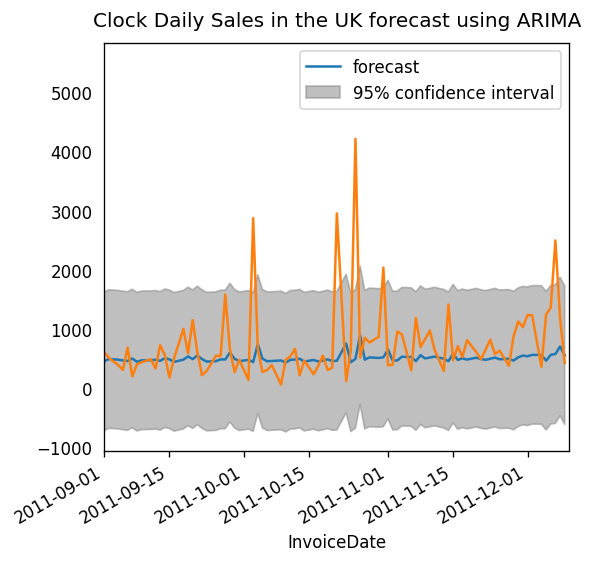

In [1350]:
# Actual vs Fitted
plot_predict(model_fitclks)
plt.plot(UK_DailyClock_df)
plt.title('Clock Daily Sales in the UK forecast using ARIMA')
plt.xlim([pd.Timestamp('2011-09-01'), pd.Timestamp('2011-12-10')])
plt.show()

#### Find good ARIMA model:

In [1077]:
UK_DailyClock_df.shape

(303, 1)

In [1163]:
# Create Training and Test
# Forecast last 30 days of series:
train_clk = UK_DailyClock_df.Sales['2010-12-01':'2011-11-04']
test_clk = UK_DailyClock_df.Sales['2011-11-05':]

In [1164]:
test_clk.shape

(30,)

##### Attempt Auto Arima for better parameters:

In [1167]:
model_clk = auto_arima(train, start_p=1, start_q=1,
 test='adf', # use adftest to find optimal 'd'
 max_p=3, max_q=3, # maximum p and q
 m=1, # frequency of series
 d=None, # let model determine 'd'
 seasonal=False, # No Seasonality
 start_P=0, 
 D=0, 
 trace=True,
 error_action='ignore',
 suppress_warnings=True, 
 stepwise=True)
print(model_clk.summary())                     

Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=4265.006, Time=0.14 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=4384.993, Time=0.00 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=4344.010, Time=0.03 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=4357.279, Time=0.05 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=4266.882, Time=0.33 sec
 ARIMA(1,0,2)(0,0,0)[0]             : AIC=4266.862, Time=0.33 sec
 ARIMA(0,0,2)(0,0,0)[0]             : AIC=4350.706, Time=0.08 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=4329.391, Time=0.02 sec
 ARIMA(2,0,2)(0,0,0)[0]             : AIC=inf, Time=0.41 sec
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=4275.497, Time=0.06 sec

Best model:  ARIMA(1,0,1)(0,0,0)[0]          
Total fit time: 1.471 seconds
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                  273
Model:               SARIMAX(1, 0, 1)   Log Likelihood             

#### According to auto-arima, the best Arima model using auto-arima is (1,0,1)

**ARIMA (1,0,0)**

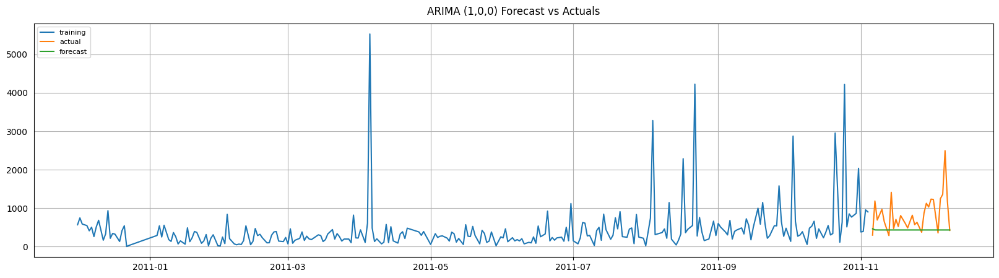

In [1266]:
# Try validating origina (1,0,0) model tried in the
# beginning:

arimaclk_model100 = ARIMA(train, order=(1, 0, 0)) 
fitted_arimaclk100 = arimaclk_model100.fit() 
# Forecast
result_clk100=fitted_arimaclk100.forecast(30, alpha=0.05) # 95% conf

results_indexed100=pd.DataFrame(result_clk100)
results_indexed100['InvoiceDate']=test.index
results_indexed100['InvoiceDate'] = pd.to_datetime(results_indexed100['InvoiceDate'])   
results_indexed100=results_indexed100.set_index('InvoiceDate')

## Plot
plt.figure(figsize=(20,5), dpi=100)
plt.grid()
plt.plot(train, label='training')
plt.plot(test, label='actual')
plt.plot(results_indexed100, label='forecast')
#plt.fill_between(lower_series.index, lower_series, upper_series, 
# color='k', alpha=.15)
plt.title('ARIMA (1,0,0) Forecast vs Actuals')
plt.legend(loc='upper left', fontsize=8)
#plt.xlim([pd.Timestamp('2011-10-01'), pd.Timestamp('2011-12-10')])
plt.show()


In [1170]:
# Calculating RMSE and MAPE

arima100_rmse = np.sqrt(mean_squared_error(test['Sales'], 
                                        results_indexed100['predicted_mean'])).round(2)
arima100_mape = np.round(np.mean(np.abs(test['Sales'] - 
                                        results_indexed100['predicted_mean'])/
                                 test['Sales'])*100,2)

results = pd.DataFrame({'Method':['ARIMA method'], 'MAPE': [arima100_mape], 
                        'RMSE': [arima100_rmse]})
results = results[['Method', 'RMSE', 'MAPE']]
results

,Method,RMSE,MAPE
0,ARIMA method,613.18,43.85


**Using auto arima Recommended model: ARIMA(1,0,1)**

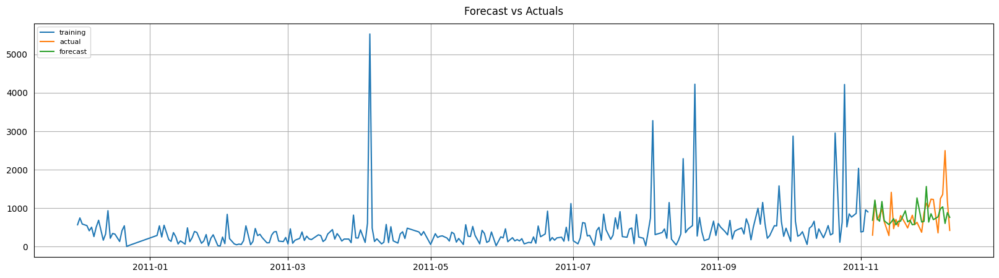

In [1352]:
# Since the Holt Winters behaved better with a seasonality
# of about 30, tried this with ARIMA and got better results
# although still not better than Holt Winters method:

arimaclk_model = ARIMA(train, order=(1, 0, 1), seasonal_order=(1,1,1,30)) 
fitted_arimaclk = arimaclk_model.fit() 

# Forecast
result_clk=fitted_arimaclk.forecast(30, alpha=0.05) # 95% conf

results_indexed=pd.DataFrame(result_clk)
results_indexed['InvoiceDate']=test.index
results_indexed['InvoiceDate'] = pd.to_datetime(results_indexed['InvoiceDate'])   
results_indexed=results_indexed.set_index('InvoiceDate')

## Plot
plt.figure(figsize=(20,5), dpi=100)
plt.grid()
plt.plot(train, label='training')
plt.plot(test, label='actual')
plt.plot(results_indexed, label='forecast')
#plt.fill_between(lower_series.index, lower_series, upper_series, 
# color='k', alpha=.15)
plt.title('Forecast vs Actuals')
plt.legend(loc='upper left', fontsize=8)
#plt.xlim([pd.Timestamp('2011-10-01'), pd.Timestamp('2011-12-10')])
plt.show()


*ARIMA (1,0,1)(1,1,1,29) model coefficients*

* diplays better AIC than the single (1,0,1) recommendation from the auto_arima function
* all coefficient p-values < 0.05
* std_error is also low

In [1355]:
print(fitted_arimaclk.summary())

                                    SARIMAX Results                                     
Dep. Variable:                            Sales   No. Observations:                  273
Model:             ARIMA(1, 0, 1)x(1, 1, 1, 30)   Log Likelihood               -1922.792
Date:                          Mon, 05 Dec 2022   AIC                           3855.584
Time:                                  11:19:52   BIC                           3873.050
Sample:                                       0   HQIC                          3862.619
                                          - 273                                         
Covariance Type:                            opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.9999      0.024     42.075      0.000       0.953       1.046
ma.L1         -0.9638      0.035    -27.555      0.

*Diagnositcs for ARIMA (1,0,1)(1,1,1,29) model:*

* residuals are still with some variability not always centered at 0
* the scatter plot for Sample Quantiles are not as inline with the theoretical as would be desired.

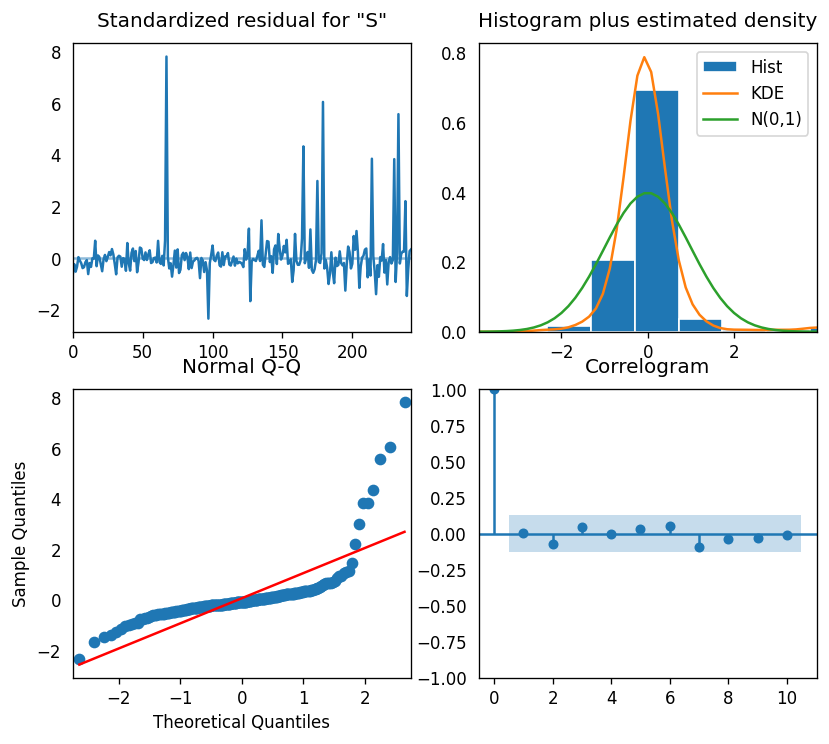

In [1359]:
fitted_arimaclk.plot_diagnostics(figsize=(8,7))
plt.show()

In [1268]:
# Calculating RMSE and MAPE

arima_rmse = np.sqrt(mean_squared_error(test['Sales'], 
                                        results_indexed['predicted_mean'])).round(2)
arima_mape = np.round(np.mean(np.abs(test['Sales'] - 
                                     results_indexed['predicted_mean'])/
                              test['Sales'])*100,2)

results = pd.DataFrame({'Method':['ARIMA method'], 'MAPE': [arima_mape], 
                        'RMSE': [arima_rmse]})
results = results[['Method', 'RMSE', 'MAPE']]
results

,Method,RMSE,MAPE
0,ARIMA method,470.62,42.29


### Neural Networks (Long Short-Term Memory Network)

(Brownlee, 2016)

In [1433]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.layers import LSTM
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error

In [783]:
UK_DailyClock_df.shape

(303, 1)

In [1434]:
# Scale data to lie between 0 and 1:

scaler = MinMaxScaler(feature_range=(0, 1))
dataset_neural = scaler.fit_transform(UK_DailyClock_df)

To maintain the train/test proportions for other models which have test size of 30, our train/test proportions are 90.2/9.8

In [1400]:
## split into train and test sets
#dataset_test=UK_DailyClock_df[['Sales']].to_numpy()
#train_size = int(len(dataset_test) * 0.902)
#test_size = len(dataset_test) - train_size
#train_nn, test_nn = dataset_test[0:train_size,:],dataset_test[train_size:len(dataset_test),:]

In [1435]:
# split into train and test sets
train_size = int(len(dataset_neural) * 0.902)
test_size = len(dataset_neural) - train_size
train_nn, test_nn = dataset_neural[0:train_size,:], dataset_neural[train_size:len(dataset_neural),:]

In [1427]:
test_size

30

In [1436]:
# convert an array of values and generate
# the X and y for our neural network with 
# where X has lagged version of y (the current t)
# and y looks at the future:

def create_dataset(dataset, look_back=1):
 dataX, datay = [], []
 for i in range(len(dataset)-look_back-1):
        a = dataset[i:(i+look_back), 0]
        dataX.append(a)
        datay.append(dataset[i + look_back, 0])
 return np.array(dataX), np.array(datay)

In [1443]:
# Run the above function on the already
# split train and test data so we now have
# X=t and y=t+1

look_back = 1
trainX, trainy = create_dataset(train_nn, look_back)
testX, testy = create_dataset(test_nn, look_back)

In [1444]:
# Data has to be reshaped to a format the neural network
# understands (samples, time steps (1), features)

trainX = np.reshape(trainX, (trainX.shape[0], 1, trainX.shape[1]))
testX = np.reshape(testX, (testX.shape[0], 1, testX.shape[1]))

In [1445]:
# create and fit the LSTM network (original attempt)
n_features_nn=1
n_steps_nn=1
model_nn = Sequential()
model_nn.add(LSTM(1, input_shape=(1, look_back)))
model_nn.add(Dense(1))
model_nn.compile(loss='mean_squared_error', optimizer='adam')
model_nn.fit(trainX, trainy, epochs=200, batch_size=1, verbose=0)

In [1446]:
# make forecast on both training and test:
trainPredict_nn = model_nn.predict(trainX)
testPredict_nn = model_nn.predict(testX)

## invert scaling done on the data:
trainPredict_nn = scaler.inverse_transform(trainPredict_nn)
trainy = scaler.inverse_transform([trainy])
testPredict_nn = scaler.inverse_transform(testPredict_nn)
testy = scaler.inverse_transform([testy])

# calculate root mean squared error
trainScore_nn = np.sqrt(mean_squared_error(trainy[0],trainPredict_nn[:,0]))
print('Train Score: %.2f RMSE' % (trainScore_nn))
testScore_nn = np.sqrt(mean_squared_error(testy[0],testPredict_nn[:,0]))
print('Test Score: %.2f RMSE' % (testScore_nn))

Train Score: 594.58 RMSE
Test Score: 539.63 RMSE


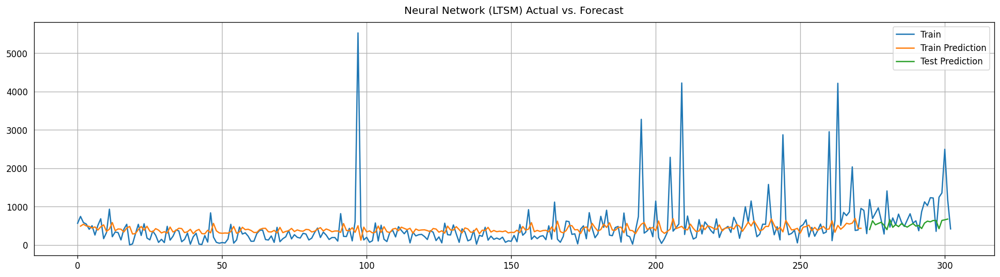

In [1419]:
## make forecast on both training and test:
#trainPredict_nn = model_nn.predict(trainX)
#testPredict_nn = model_nn.predict(testX)

## invert scaling done on the data:
#trainPredict_nn = scaler.inverse_transform(trainPredict_nn)
#trainy = scaler.inverse_transform([trainy])
#testPredict_nn = scaler.inverse_transform(testPredict_nn)
#testy = scaler.inverse_transform([testy])

# shift train predictions so they can plot
# in line with the original data:
trainPredictPlot_nn = np.empty_like(dataset)
trainPredictPlot_nn[:, :] = np.nan
trainPredictPlot_nn[look_back:len(trainPredict_nn)+
                    look_back, :] = trainPredict_nn

# shift test predictions so they can plot in
# line with the original data:
testPredictPlot_nn = np.empty_like(dataset)
testPredictPlot_nn[:, :] = np.nan
testPredictPlot_nn[len(trainPredict_nn)+(look_back*2)+
                   1:len(dataset)-1, :] = testPredict_nn

# plot baseline and predictions
plt.figure(figsize=(20,5))
plt.grid()
plt.plot(scaler.inverse_transform(dataset_neural), 
         label='Train')
plt.plot(trainPredictPlot_nn, label='Train Prediction')
plt.plot(testPredictPlot_nn, label='Test Prediction')
plt.title('Neural Network (LTSM) Actual vs. Forecast')
plt.legend(loc='best')
plt.show()

As impressive as Neural Nets can be, and seeing that the forecast does follow any trend however slight in the data, the performance is still lacking when compared to the Holt-Winters model, as was also the case in the Practical Time Series Forecasting example for Chapter 9 (Shmueli & Lichtendahl Jr., 2018)

### Linear Regression

In [1335]:
# This version is not fully comparable to the other methods
# given that the regression is done on a known test data set 
# with already known lags, which would normally only be 
# available as forecasted lags. However, this is to demonstrate
# even with known data, the linear regression model
# does not seem to outperform many of the other 
# data driven models for this series.

train_lr=train.copy()

# Adding lagged versions of data to use
# in liner regression to use as input predictors:

train_lr['Lag_1'] = train_lr['Sales'].shift(1)

# given their site may have some weak weekly trends
# and they have 6 day weeks:
train_lr['Lag_6'] = train_lr['Sales'].shift(6)


from sklearn.linear_model import LinearRegression

X_lr = train_lr.loc[:, ['Lag_1','Lag_6']]
X_lr.dropna(inplace=True)  # drop missing values in the feature set
y_lr = train_lr.loc[:, 'Sales']  # create the target
y_lr, X_lr = y_lr.align(X, join='inner')  # drop corresponding values in target

model_lr = LinearRegression()
model_lr.fit(X_lr, y_lr)

y_pred_lr_train = pd.Series(model_lr.predict(X_lr), 
                            index=X_lr.index)

# Do the same with test data:

test_lr = test.copy()

test_lr['Lag_1'] = test_lr['Sales'].shift(1)
test_lr['Lag_6'] = test_lr['Sales'].shift(6)

X_test_lr = test_lr.loc[:, ['Lag_1','Lag_6']]
X_test_lr.dropna(inplace=True) 
y_pred_lr = pd.Series(model_lr.predict(X_test_lr), 
                      index=X_test_lr.index)



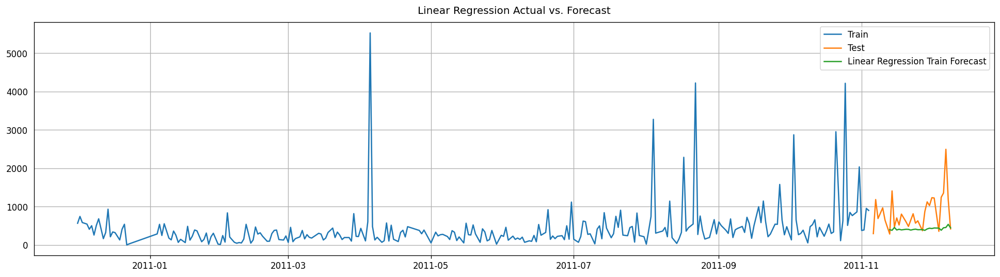

In [1336]:
plt.figure(figsize=(20,5))
plt.grid()
plt.plot( train_lr['Sales'], label='Train')
plt.plot(test_lr['Sales'], label='Test')
plt.plot(y_pred_lr, label='Linear Regression Train Forecast')
plt.title('Linear Regression Actual vs. Forecast')
plt.legend(loc='best')
plt.show()

In [1337]:
# Calculating RMSE and MAPE

# because output is for anything after lag of 6, 
# need to onlly include data from original dataset
# that represents the last 64 samples instead of 60:

test_lr_error = test_lr.iloc[6:]
lr_rmse = np.sqrt(mean_squared_error(test_lr_error['Sales'], 
                                        y_pred_lr)).round(2)
lr_mape = np.round(np.mean(np.abs(test_lr_error['Sales'] - 
                                  y_pred_lr)/
                           test_lr_error['Sales'])*100,2)

results_lr = pd.DataFrame({'Method':['LR method'], 'MAPE': [lr_mape], 
                           'RMSE': [lr_rmse]})
results_lr = results_lr[['Method', 'RMSE', 'MAPE']]
results_lr

,Method,RMSE,MAPE
0,LR method,651.3,43.61


In [1338]:
# Table Results

Table = PrettyTable(["Model", "RMSE"])
Table.add_row(["Naive", n_rmse])
Table.add_row(["Simple Average", sa_rmse])
Table.add_row(["Moving Average", ma_rmse])
Table.add_row(["Simple Exponential", se_rmse])
Table.add_row(["Holt Linear", hl_rmse])
Table.add_row(["Holt Winter", hw_rmse])
Table.add_row(["Holt Winter iterative", hw_rmse12])
Table.add_row(["ARIMA (1,0,0)", arima100_rmse])
Table.add_row(["ARIMA (1,0,1)(1,1,30)", arima_rmse])
Table.add_row(["Linear Regression", lr_rmse])
Table.add_row(["Neural Network (LSTM)", round(testScore_nn,2)])
print("Time Series Model Performance Sorted by RMSE")
Table.sortby = "RMSE"
print(Table)

Time Series Model Performance Sorted by RMSE
+-----------------------+--------+
|         Model         |  RMSE  |
+-----------------------+--------+
| Holt Winter iterative | 392.78 |
|      Holt Winter      | 401.7  |
|     Moving Average    | 449.3  |
|   Simple Exponential  | 449.3  |
|         Naive         | 452.17 |
| ARIMA (1,0,1)(1,1,30) | 470.62 |
|      Holt Linear      | 470.65 |
| Neural Network (LSTM) | 533.65 |
|     Simple Average    | 613.02 |
|     ARIMA (1,0,0)     | 613.18 |
|   Linear Regression   | 651.3  |
+-----------------------+--------+


-----